In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import glob 


In [2]:
import pylab  # This will allow us to show the images in gray scale 
              # when we call imshow with the parameter cmap=pylab.gray()


In [3]:
import warnings
warnings.filterwarnings('ignore')

## Camera Calibration

In [4]:
def calibration(path, verbose=False):
    # Read in and make a list of calibration images 
    images = glob.glob(path)

    # Arrays to store object points and images points from all the images

    objpoints = []  # 3D points in real world space
    imgpoints = []  # 2D points in image plane 

    nx = 9
    ny = 6

    # Prepare object points 
    objp = np.zeros((nx*ny, 3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)


    for fname in images: 
        # Read in each images 
        img = mpimg.imread(fname)
        
        # Convert image to grayscale 
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    
        # If corners are found, add object points, image points 
        if ret == True:
            
            imgpoints.append(corners)
            objpoints.append(objp)
        
            if verbose == True:
                # draw and display the corners
                img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
                plt.imshow(img)
                plt.show()

    return objpoints, imgpoints

In [5]:
path_to_images = './camera_cal/calibration*.jpg'
objpoints, imgpoints = calibration(path_to_images, verbose=False)

In [6]:
fname =  './camera_cal/calibration10.jpg'
img = mpimg.imread(fname)

In [7]:
xsize = img.shape[0]
ysize = img.shape[1]
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

ret, corners = cv2.findChessboardCorners(gray, (xsize, ysize), None)
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)


## Scaling the images 

We use the following function in order to scale the images to the range 0-255. 

In [8]:
def scale(image, maxold, minold):
    if maxold >= 250 and maxold <=260:
        return image
    else:        
        return  int(((255.0 / float(maxold - minold))*float(image - maxold)) + 255.0)

scale = np.vectorize(scale)

## Distorsion correction

In [9]:
# This function performs the camera calibration, image distortion correction and 
# returns the undistorted image
def cal_undistort(img):
    # Use cv2.calibrateCamera() and cv2.undistort()
    #undist = np.copy(img)  # Delete this line
    xsize = img.shape[0]
    ysize = img.shape[1]
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    undist = cv2.undistort(img, mtx, dist, None, mtx)

    return undist

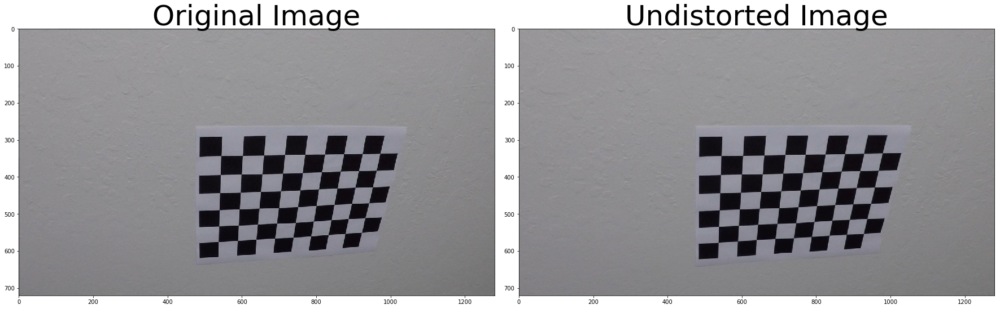

In [10]:
# Read in an image
fname =  './camera_cal/calibration10.jpg'
img = mpimg.imread(fname)

undistorted = cal_undistort(img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

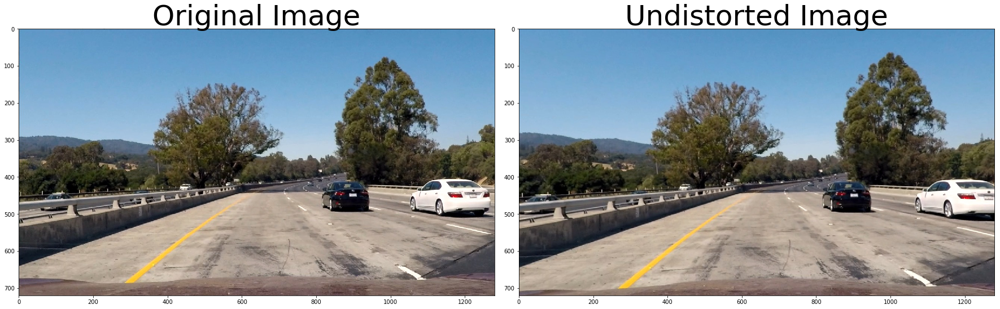

In [11]:
# Read in an image
fname =  './test_images/test1.jpg'

img = mpimg.imread(fname)

undistorted = cal_undistort(img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)



## Creating a thresholded binary image

In [12]:
luv = cv2.cvtColor(undistorted, cv2.COLOR_RGB2LUV)

L = luv[:,:,0]
U = luv[:,:,1]
V = luv[:,:,2]

max_pix = np.max(L)
min_pix = np.min(L)
L = scale(L, max_pix, min_pix)  


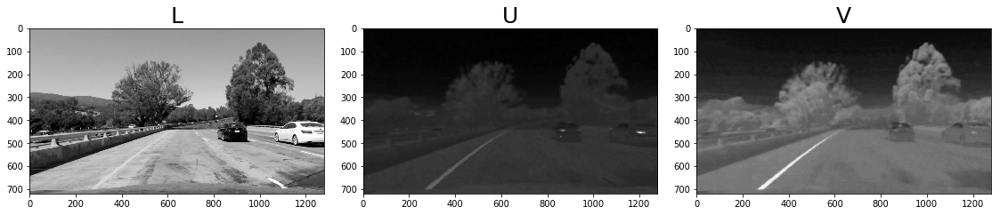

In [13]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 9))
f.tight_layout()
ax1.imshow(L, cmap=pylab.gray())
ax1.set_title('L', fontsize=25)
ax2.imshow(U, cmap=pylab.gray())
ax2.set_title('U', fontsize=25)
ax3.imshow(V, cmap=pylab.gray())
ax3.set_title('V', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

The L channel picks up the white lines well, so let's try applying a threshold there:

In [14]:
thresh = (225, 255)
binary = np.zeros_like(L)
binary[(L > thresh[0]) & (L <= thresh[1])] = 1

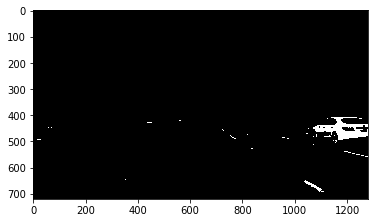

In [15]:
plt.imshow(binary, cmap=pylab.gray())
plt.show()

In [16]:
lab = cv2.cvtColor(undistorted, cv2.COLOR_RGB2LAB)

L = lab[:,:,0]
A = lab[:,:,1]
B = lab[:,:,2]

max_pix = np.max(B)
min_pix = np.min(B)
B = scale(B, max_pix, min_pix)

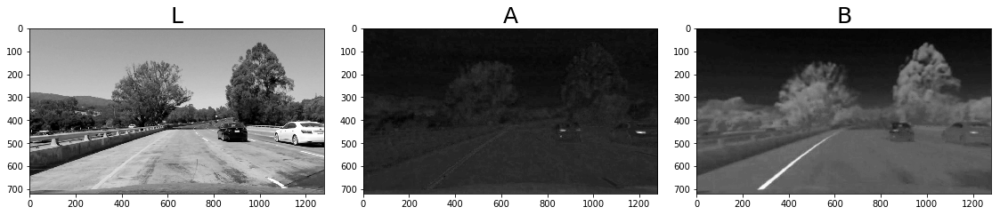

In [17]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 9))
f.tight_layout()
ax1.imshow(L, cmap=pylab.gray())
ax1.set_title('L', fontsize=25)
ax2.imshow(A, cmap=pylab.gray())
ax2.set_title('A', fontsize=25)
ax3.imshow(B, cmap=pylab.gray())
ax3.set_title('B', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

The B channel detects yellow line well, so let's try applying a threshold there:

In [18]:
thresh = (125, 200)
binary = np.zeros_like(B)
binary[(B > thresh[0]) & (B <= thresh[1])  ] = 1

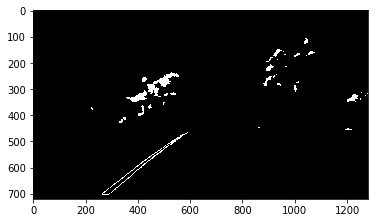

In [19]:
plt.imshow(binary, cmap=pylab.gray())
plt.show()

We are going to create the following function. 

In [20]:
def luv_lab_thresholded_image(img):  
    
    luv = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    L = luv[:,:,0]    
    max_pix = np.max(L)
    min_pix = np.min(L)        
    L = scale(L, max_pix, min_pix)    
            
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    B = lab[:,:,2]    
    max_pix = np.max(B)
    min_pix = np.min(B)
    B = scale(B, max_pix, min_pix)        
            
    thresh1 = (225, 255)    
    thresh2 = (125, 200)
        
    binary = np.zeros_like(L)    
    binary[ ( (L > thresh1[0]) & (L <= thresh1[1]) ) |   ( (B > thresh2[0]) & (B <= thresh2[1]) )  ] = 1    
            
    return binary

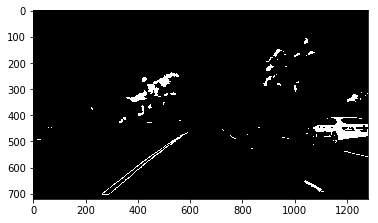

In [21]:
binary = luv_lab_thresholded_image(undistorted)
plt.imshow(binary, cmap=pylab.gray())
plt.show()

## Applying a mask 

In [22]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


In [23]:
vertices = np.array([[(150,700),  (400, 430), (1050, 430), (1200, 700)]], dtype=np.int32)

masked_image = region_of_interest(binary, vertices)

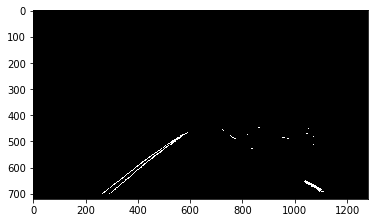

In [24]:
plt.imshow(masked_image, cmap=pylab.gray())
plt.show()

## Gradient threshold

We are going to take the gradient in the x direction with a threshold.  

In [25]:
# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    
    # Apply the following steps to img
    # 1) Take the derivative in x or y given orient = 'x' or 'y'
    # 2) Take the absolute value of the derivative or gradient
    # 3) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    # 4) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    # 5) Return this mask as your binary_output image
    
    # The img parameters must be in gray scale.    
    
    gray  = img 
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    
    return binary_output

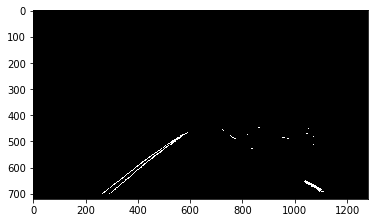

In [26]:
gradx = abs_sobel_thresh(masked_image, orient='x', thresh_min = 100,  thresh_max = 255)
plt.imshow(masked_image, cmap=pylab.gray())
plt.show()

## Perspective transform

We define the following function, in order to apply perspective transform to the images.

In [27]:
# Define perspective transform image 
def warp(img):
    
    # Define calibration box in source (original) and destination (desired or warped) coordinates 
    
    img_size = (img.shape[1], img.shape[0])
    
    # define 4 source points for perspective transformation
        
    src = np.float32([(200, 720), (580, 480), (720, 480), (1050, 700)])
    dst = np.float32([(280, 720), (400, 190), (920, 190), (960, 720)])
             
        
    # Compute the perspective transform, M 
    M = cv2.getPerspectiveTransform(src, dst)
    
    # Could compute the inverse also by swapping the input parameters 
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # Create warped image - use linear interpolation
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped, Minv


We use the following class to keep track information of the previous fitted lines. 

In [28]:
# This class is useful to keep trak the information of the previous fitted lines.
class Lines(object):
    
    
    def __init__(self):
        self.ploty = None
        self.left_fit = None 
        self.right_fit = None
        self.left_fitx = None 
        self.right_fitx = None
    
    def save(self, ploty, left_fit, right_fit, left_fitx, right_fitx):
        self.ploty = ploty
        self.left_fit = left_fit
        self.right_fit = right_fit
        self.left_fitx = left_fitx
        self.right_fitx = right_fitx
    
    def recover(self):
        return self.ploty, self.left_fit, self.right_fit, self.left_fitx, self.right_fitx


    
    
lane_line = Lines()

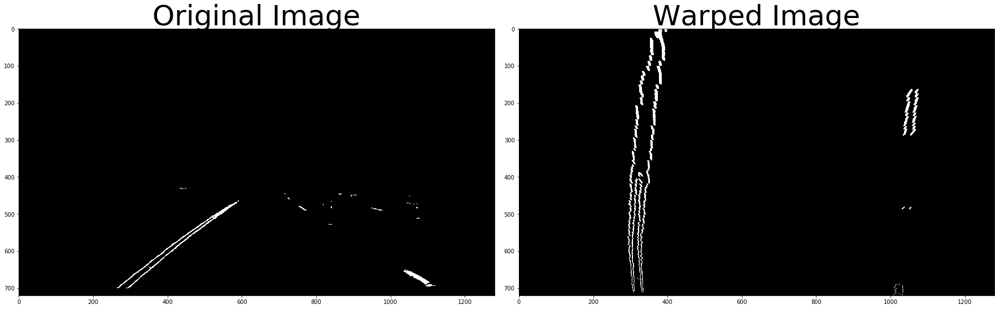

In [29]:
binary_warped, _ = warp(gradx)


f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(masked_image, cmap=pylab.gray())
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(binary_warped, cmap=pylab.gray())
ax2.set_title('Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


## Generating lines

We create a function that return the following parameters:
* ploty
* left_fitx 
* right_fitx
* left_fit
* right_fit 


This parameter must be calculated from the warped binary image.

In [30]:
def generate_lines(binary_warped):
    

    #import scipy.interpolate as inter
    from scipy import interpolate

    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    
    if lane_line.ploty is None:
        # Step through the windows one by one
        for window in range(nwindows):        
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high), (0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high), (0,255,0), 2) 
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                             (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                             (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds] 

    else:
        # Assume you now have a new warped binary image 
        # from the next frame of video (also called "binary_warped")
        # It's now much easier to find line pixels!
        
        _, left_fit, right_fit, _, _ = lane_line.recover()
        
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        margin = 100
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                          left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                          left_fit[1]*nonzeroy + left_fit[2] + margin))) 

        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                          right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                          right_fit[1]*nonzeroy + right_fit[2] + margin)))  
        
        

        # Again, extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
                
        
        # Sanity check 
        curverad_left = radius_curvature(ploty, left_fitx)
        curverad_right = radius_curvature(ploty, right_fitx)
        
        mid_point = np.mean( np.array([ left_fitx, right_fitx ]), axis=0 )
        
        curverad_med = radius_curvature(ploty, mid_point)
        
        if curverad_left > curverad_right:
            if  not (curverad_med > curverad_right and curverad_med < curverad_left):
                ploty, left_fit, right_fit, left_fitx, right_fitx = lane_line.recover()
                return ploty, left_fit, right_fit, left_fitx, right_fitx 
            else:                
                return ploty, left_fit, right_fit, left_fitx, right_fitx 
        elif curverad_left < curverad_right:
            if  not (curverad_med < curverad_right and curverad_med > curverad_left):
                ploty, left_fit, right_fit, left_fitx, right_fitx = lane_line.recover()
                return ploty, left_fit, right_fit, left_fitx, right_fitx 
            else:                
                return ploty, left_fit, right_fit, left_fitx, right_fitx 
        else:            
            return ploty, left_fit, right_fit, left_fitx, right_fitx 
                                                                
        
    
    ## Sanity check 
    
    if lefty.shape[0] == 0 or righty.shape[0] == 0:        
        ploty, left_fit, right_fit, left_fitx, right_fitx = lane_line.recover()
        return ploty, left_fit, right_fit, left_fitx, right_fitx 
    
        
    
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
    
    return ploty, left_fit, right_fit, left_fitx, right_fitx 


### Processing the images 

Firstly, we define a function to calculate the radius curvature.

In [31]:
#def radius_curvature(ploty, leftx, rightx):
def radius_curvature(ploty, x):
            
    # I'll choose the maximum y-value, corresponding to the bottom of the image    
    y_eval = np.max(ploty)
        
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    fit_cr = np.polyfit(ploty*ym_per_pix, x*xm_per_pix, 2)
        
    # Calculate the new radii of curvature
    curverad = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix +  fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])        
   
    return curverad

After that, we define a helper function to process the images:

In [32]:
def process_image(image, verbose=True):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
   
    undist = cal_undistort(image)    
    binary = luv_lab_thresholded_image(undist) 
   

    ymax = binary.shape[0]
    xmax = binary.shape[1]

    vertices = np.array([[(150,700),  (400, 430), (1050, 430), (1200, 700)]], dtype=np.int32)
    
    masked_image = region_of_interest(binary, vertices)
    
    gradx = abs_sobel_thresh(masked_image, orient='x', thresh_min = 100,  thresh_max = 255)    
    
    warped, Minv = warp(gradx)    
    
    ploty, left_fit, right_fit,  left_fitx, right_fitx  = generate_lines(warped)
    lane_line.save(ploty, left_fit, right_fit,  left_fitx, right_fitx)    
       
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0]))
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
   
    if verbose == True:
        font = cv2.FONT_HERSHEY_SIMPLEX

        # Define conversions in x and y from pixels space to meters
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension
       
        curverad_left = radius_curvature(ploty, left_fitx)
        curverad_right = radius_curvature(ploty, right_fitx)
        
        mid_point = np.mean( np.array([ left_fitx, right_fitx ]), axis=0 )
        
        curverad_med = radius_curvature(ploty, mid_point)
        
        
        y_left_value = left_fitx.shape[0] - 1
        y_right_value = right_fitx.shape[0] - 1
        
        
        center_lane = (left_fitx[y_left_value]  + right_fitx[y_right_value]) / 2.0  # estimation of the center of the lane
        position_car = image.shape[1] // 2.0   # position of the car
        offset = (center_lane - position_car)       
        offset *= xm_per_pix
       
        cv2.putText(result, 'Radius of curvature (left)  = %.2f m' % (curverad_left), (10, 40), font, 1,
                        (255, 255, 255), 2, cv2.LINE_AA)
        
        cv2.putText(result, 'Radius of curvature (right)  = %.2f m' % (curverad_right), (10, 100), font, 1,
                        (255, 255, 255), 2, cv2.LINE_AA)
        
        cv2.putText(result, 'Radius of curvature (medium)  = %.2f m' % (curverad_med), (10, 160), font, 1,
                        (255, 255, 255), 2, cv2.LINE_AA)
        
        
        if offset >= 0:
            cv2.putText(result, 'Vehicle is %.2f m left of center' % (abs(offset)),
                        (10, 220), font, 1, (255, 255, 255), 2, cv2.LINE_AA)
        else:
            cv2.putText(result, 'Vehicle is %.2f m right of center' % (abs(offset)),
                        (10, 220), font, 1, (255, 255, 255), 2, cv2.LINE_AA)       
           
    
    return result     

In [33]:
path_to_images = './test_images/test*.jpg'
images = glob.glob(path_to_images)

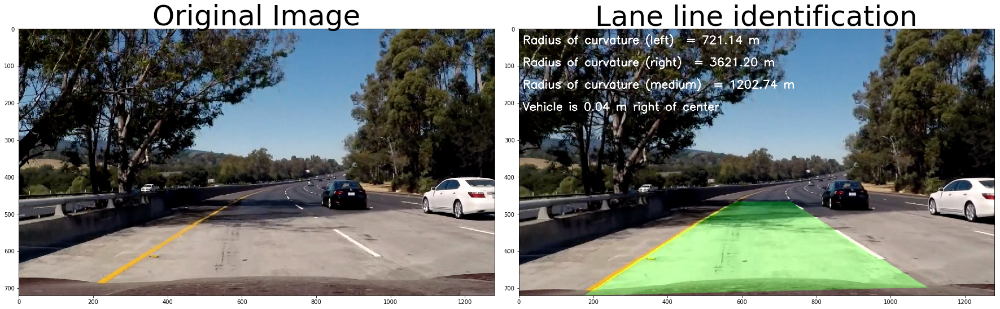

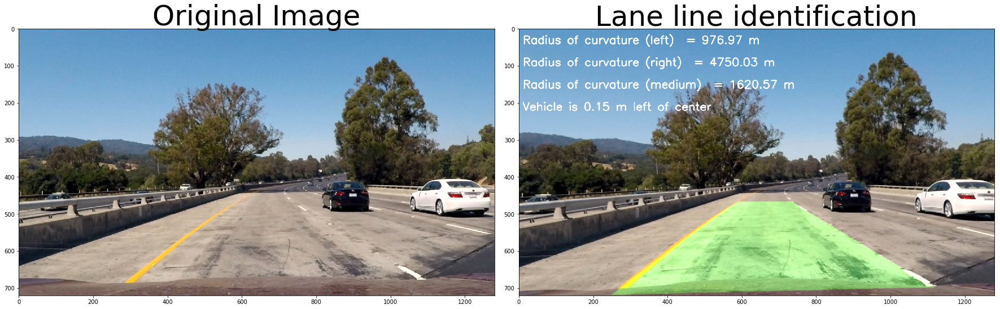

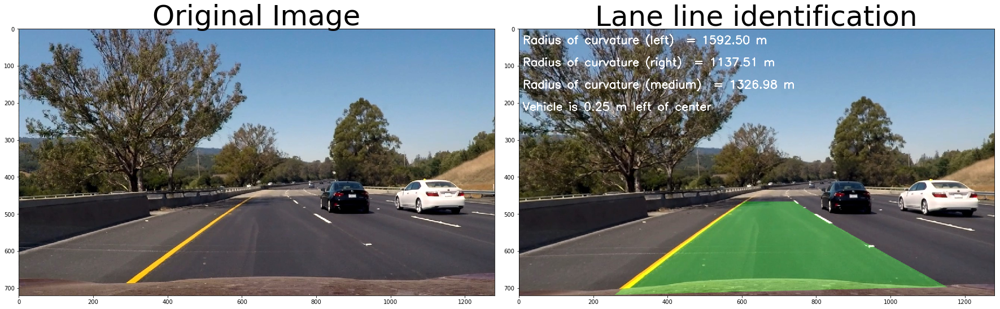

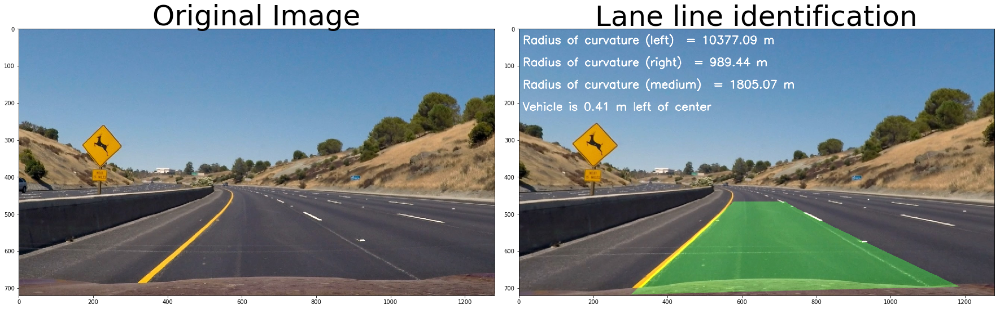

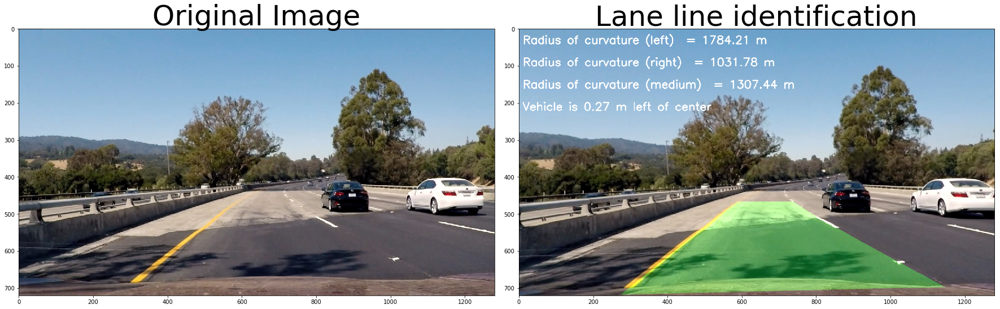

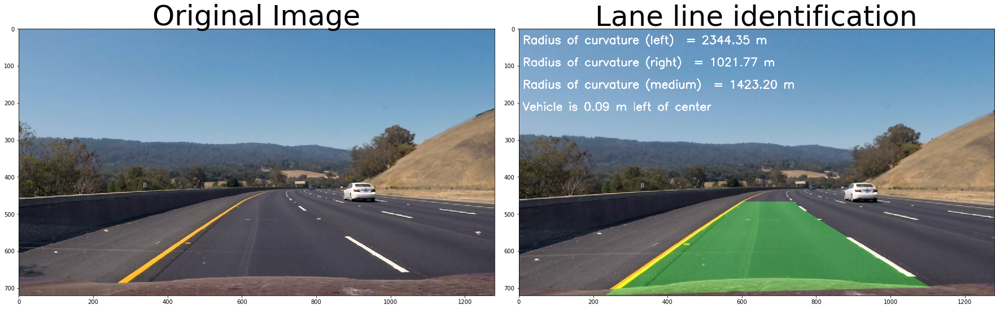

In [34]:
for fname in images: 
    # Read in each images 
    img = mpimg.imread(fname)
    
    result = process_image(img)
                
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(result)
    ax2.set_title('Lane line identification', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)        

In [35]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML


video_input = './project_video.mp4'
video_output = './output_videos/outputVideo.mp4'

project_video = VideoFileClip(video_input)

treated_video = project_video.fl_image(process_image)
%time treated_video.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video ./output_videos/outputVideo.mp4
[MoviePy] Writing video ./output_videos/outputVideo.mp4


100%|█████████▉| 1260/1261 [27:57<00:01,  1.33s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_videos/outputVideo.mp4 

CPU times: user 32min 32s, sys: 2.46 s, total: 32min 34s
Wall time: 27min 58s
